In [20]:
def heatMap(df):
    #Create Correlation df
    corr = df.corr()
    #Plot figsize
    fig, ax = plt.subplots(figsize=(10, 10))
    #Generate Color Map
    colormap = sns.diverging_palette(220, 10, as_cmap=True)
    #Generate Heat Map, allow annotations and place floats in map
    sns.heatmap(corr, cmap=colormap, annot=True, fmt=".2f")
    #Apply xticks
    plt.xticks(range(len(corr.columns)), corr.columns);
    #Apply yticks
    plt.yticks(range(len(corr.columns)), corr.columns)
    #show plot
    plt.show()

In [14]:
train_X = train.drop('default', axis=1)
train_y = train['default']

In [4]:
SEED = 53
NUM_CLASSES =2

In [5]:
labelMap = {
    0:'Not Default',
    1:'Default'
}

In [7]:
from sklearn.manifold import TSNE
X_decomposed = TSNE(n_components=2).fit_transform(train_X)

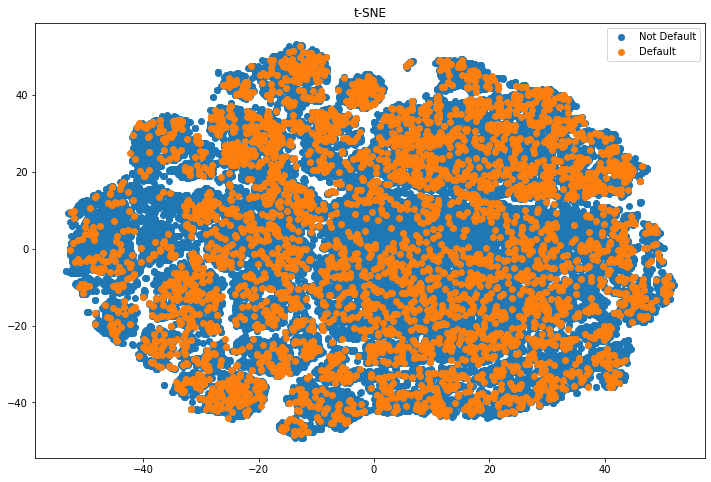

In [8]:
fig, ax = plt.subplots(1, 1, figsize=(12, 8))

for i in range(2):
    idx = train_y == i
    ax.scatter(X_decomposed[idx, 0], X_decomposed[idx, 1], label=labelMap[i])
ax.set_title("t-SNE")
ax.legend()

In [14]:
from sklearn.decomposition import PCA
import plotly.graph_objs as go
from plotly.offline import download_plotlyjs, init_notebook_mode, plot, iplot

In [17]:
train_idx = 64000

In [33]:
pca = PCA(n_components=3)
emb = pca.fit_transform(train_X)
te_emb = emb[train_idx:]
emb = emb[:train_idx]

In [28]:
y = train_y
init_notebook_mode(connected=True)

In [29]:
data = [go.Scatter3d(
    x=emb[np.array(y) == t, 0],
    y=emb[np.array(y) == t, 1],
    z=emb[np.array(y) == t, 2],
    mode='markers',
    marker=dict(
        size=3,
        opacity=0.75
    ),
    name=labelMap[t]
)
    for t in list(set(y))
]

In [30]:
import plotly
import plotly.graph_objs as go
plotly.offline.init_notebook_mode()

In [31]:
data.append(go.Scatter3d(
    x=te_emb[:, 0],
    y=te_emb[:, 1],
    z=te_emb[:, 2],
    mode='markers',
    marker=dict(
        color='#c0c0c0',
        size=2,
        opacity=0.75
    ),
    name='test data'
))

layout = go.Layout(
    margin=dict(
        l=0,
        r=0,
        b=0,
        t=0
    ),
)
fig = go.Figure(data=data, layout=layout)
iplot(fig, filename='simple-3d-scatter')

In [34]:
print(f'pca components explained variance is {sum(pca.explained_variance_ratio_)}')

pca components explained variance is 0.6861747677285641
